## Carga del Dataset y elección random de imagenes

### Imports

In [ ]:
import sys
#!{sys.executable} -m pip install --quiet --upgrade pip
#!{sys.executable} -m pip install --quiet opencv-python matplotlib numpy scikit-image

import os
import math
import random
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from pathlib import Path

### Carga dataset y elección random de imagenes de 2 clases

In [11]:
# === 1) Unzip the dataset ===
def unzip_dataset(zip_path, extract_to="./dataset"):
    """
    Unzips the dataset if not already extracted.
    Returns the path where it was extracted.
    """
    if not os.path.exists(extract_to):
        os.makedirs(extract_to, exist_ok=True)

    # Check if already extracted
    expected_folders = ["Train", "Test", "Testing"]
    if all(os.path.exists(os.path.join(extract_to, f)) for f in expected_folders):
        print("Dataset already extracted.")
        return extract_to

    print(f"Extracting {zip_path} to {extract_to} ...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    print("Extraction complete ✅")

    # Show what was extracted
    print("Folders inside dataset:")
    for item in os.listdir(extract_to):
        print(" -", item)
    
    return extract_to


# === 2) Your function (slightly integrated) ===
def seleccionar_imagenes_aleatorias(dir_train, num_imagenes_por_clase=5, semilla=42):
    import os, random
    random.seed(semilla)
    if not os.path.exists(dir_train):
        print(f"El directorio {dir_train} no existe.")
        return {}
    clases_dirs = [d for d in os.listdir(dir_train) if os.path.isdir(os.path.join(dir_train, d))]
    imagenes_seleccionadas = {}
    for clase_dir in clases_dirs:
        path_clase = os.path.join(dir_train, clase_dir)
        archivos_img = [f for f in os.listdir(path_clase) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        if not archivos_img: 
            continue
        seleccion = archivos_img if len(archivos_img) <= num_imagenes_por_clase else random.sample(archivos_img, num_imagenes_por_clase)
        clase_id = int(clase_dir) if clase_dir.isdigit() else clase_dir
        imagenes_seleccionadas[clase_id] = [os.path.join(path_clase, img) for img in seleccion]
    return imagenes_seleccionadas


# === 3) Load & visualize some images (optional) ===
def mostrar_muestras(muestras, clases_a_mostrar=['0', '10'], num_por_clase=2):
    """
    Displays a few random images per selected class.
    """
    for clase in clases_a_mostrar:
        imgs = muestras.get(clase, [])
        if not imgs:
            print(f"No hay imágenes para la clase {clase}")
            continue

        plt.figure(figsize=(8, 3))
        for i, ruta in enumerate(imgs[:num_por_clase]):
            img = cv2.imread(ruta)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(1, num_por_clase, i+1)
            plt.imshow(img)
            plt.title(f"Clase {clase}")
            plt.axis("off")
        plt.tight_layout()
        plt.show()


Dataset already extracted.

✅ Se seleccionaron imágenes de 63 clases.
Ejemplo clase '0': ['./data\\Train\\0\\00000_00017_00016.png', './data\\Train\\0\\00000_00006_00023.png']
Ejemplo clase '10': ['./data\\Train\\10\\00010_00010_00002.png', './data\\Train\\10\\00010_00058_00013.png']


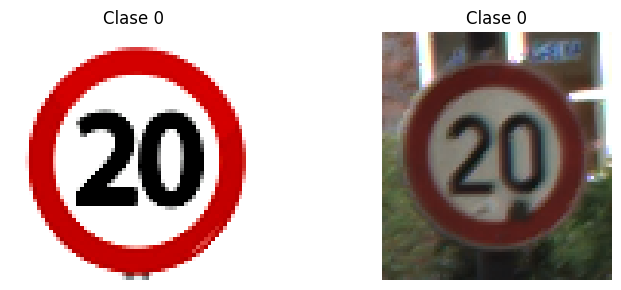

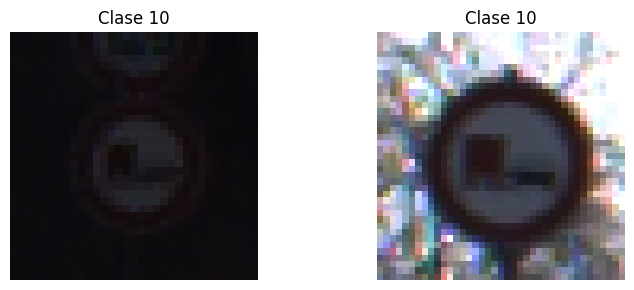

In [ ]:
# Path to your compressed file (adjust the filename)
zip_path = "Dataset.zip"

# Step 1: unzip
dataset_path = unzip_dataset(zip_path, extract_to="./data")

# Step 2: point to the Train folder
dir_entrenamiento = os.path.join(dataset_path, "Train")

# Step 3: select a small random subset
muestra_imagenes = seleccionar_imagenes_aleatorias(dir_entrenamiento, num_imagenes_por_clase=3, semilla=2212)

print(f"\n✅ Se seleccionaron imágenes de {len(muestra_imagenes)} clases.")
print("Ejemplo clase '0':", muestra_imagenes.get('0', [])[:2])
print("Ejemplo clase '10':", muestra_imagenes.get('10', [])[:2])

# Step 4: visualize (optional)
mostrar_muestras(muestra_imagenes, clases_a_mostrar=['0', '10'], num_por_clase=2)


## Pipeline para BT1d — Filtros lineales / bancos de filtros

### Filtros primitivos

In [16]:
# ---------- helpers ----------
def to_gray_uint8(bgr):
    g = cv.cvtColor(bgr, cv.COLOR_BGR2GRAY)
    return g

def normalize_01(imgf):
    imgf = imgf.astype(np.float32)
    m, M = np.min(imgf), np.max(imgf)
    if M - m < 1e-8:
        return np.zeros_like(imgf, dtype=np.float32)
    return (imgf - m) / (M - m)

def to_u8_0_255(imgf):
    return (normalize_01(imgf) * 255).astype(np.uint8)

# ---------- linear filters ----------
def gaussian_blur(img, k=5, sigma=1.0):
    return cv.GaussianBlur(img, (k, k), sigmaX=sigma, sigmaY=sigma)

def unsharp(img, sigma=1.0, amount=1.5):
    blur = cv.GaussianBlur(img, (0,0), sigma)
    # (1+amount)*img - amount*blur
    return cv.addWeighted(img, 1+amount, blur, -amount, 0)

def sobel_mag(img):
    sx = cv.Sobel(img, cv.CV_32F, 1, 0, ksize=3)
    sy = cv.Sobel(img, cv.CV_32F, 0, 1, ksize=3)
    mag = cv.magnitude(sx, sy)
    return mag  # float32

def prewitt_mag(img):
    kx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]], dtype=np.float32)
    ky = kx.T
    px = cv.filter2D(img, cv.CV_32F, kx)
    py = cv.filter2D(img, cv.CV_32F, ky)
    return cv.magnitude(px, py)

def laplacian_edges(img, ksize=3):
    lap = cv.Laplacian(img, cv.CV_32F, ksize=ksize)
    return np.abs(lap)

# ---------- Gabor ----------
def gabor_kernel(ksize=21, sigma=5, theta=0.0, lambd=10.0, gamma=0.5, psi=0):
    return cv.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv.CV_32F)

def apply_gabor_bank(img, thetas, lambdas, sigma=5, gamma=0.5, ksize=21):
    responses = {}
    for th in thetas:
        for lam in lambdas:
            k = gabor_kernel(ksize=ksize, sigma=sigma, theta=th, lambd=lam, gamma=gamma)
            resp = cv.filter2D(img, cv.CV_32F, k)
            key = f"gabor_th{int(np.rad2deg(th))}_lam{int(lam)}"
            responses[key] = resp
    # a handy aggregate channel: pixelwise max across orientations
    stack = np.stack(list(responses.values()), axis=-1) if responses else None
    if stack is not None:
        responses["gabor_max"] = np.max(stack, axis=-1)
    return responses

# ---------- Ad-Hoc masks ----------
def donut_kernel(radius=9, thickness=3):
    r, t = radius, thickness
    d = 2*r + 1
    Y, X = np.ogrid[-r:r+1, -r:r+1]
    dist = np.sqrt(X*X + Y*Y)
    ring = ((dist <= r) & (dist >= r-t)).astype(np.float32)
    s = ring.sum()
    if s > 0:
        ring /= s
    ring -= ring.mean()  # zero-mean so it acts like an edge enhancer at that radius
    return ring

def line_kernel(angle_deg, length=9):
    L = length
    k = np.zeros((L, L), np.float32)
    c = L//2
    ang = np.deg2rad(angle_deg)
    for t in np.linspace(-c, c, 2*L):
        x = int(round(c + t*np.cos(ang)))
        y = int(round(c + t*np.sin(ang)))
        if 0 <= x < L and 0 <= y < L:
            k[y, x] = 1.0
    s = k.sum()
    if s > 0:
        k /= s
    k -= k.mean()
    return k


In [17]:
def run_filter_bank_on_gray(gray):
    out = {}

    # 1) Sharpen (helps borders)
    out["unsharp"] = unsharp(gray, sigma=1.0, amount=1.5).astype(np.float32)

    # 2) Classic edges
    out["sobel_mag"] = sobel_mag(gray)
    out["laplacian_k3"] = laplacian_edges(gray, ksize=3)

    # 3) Gabor bank (orientations & wavelengths)
    thetas = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    lambdas = [6, 10, 14]
    out.update(apply_gabor_bank(gray, thetas, lambdas, sigma=5, gamma=0.5, ksize=21))

    # 4) Ad-Hoc
    for R in [6, 9]:
        dk = donut_kernel(radius=R, thickness=3)
        out[f"donut_R{R}"] = cv.filter2D(gray, cv.CV_32F, dk)
    for ang in [0, 30, 60, 90, 120, 150]:
        lk = line_kernel(ang, length=9)
        out[f"line_{ang}"] = cv.filter2D(gray, cv.CV_32F, lk)

    return out  # dict: name -> float32 response


In [18]:
def run_filter_bank_on_gray(gray):
    out = {}

    # 1) Sharpen (helps borders)
    out["unsharp"] = unsharp(gray, sigma=1.0, amount=1.5).astype(np.float32)

    # 2) Classic edges
    out["sobel_mag"] = sobel_mag(gray)
    out["laplacian_k3"] = laplacian_edges(gray, ksize=3)

    # 3) Gabor bank (orientations & wavelengths)
    thetas = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    lambdas = [6, 10, 14]
    out.update(apply_gabor_bank(gray, thetas, lambdas, sigma=5, gamma=0.5, ksize=21))

    # 4) Ad-Hoc
    for R in [6, 9]:
        dk = donut_kernel(radius=R, thickness=3)
        out[f"donut_R{R}"] = cv.filter2D(gray, cv.CV_32F, dk)
    for ang in [0, 30, 60, 90, 120, 150]:
        lk = line_kernel(ang, length=9)
        out[f"line_{ang}"] = cv.filter2D(gray, cv.CV_32F, lk)

    return out  # dict: name -> float32 response


In [19]:
def show_filter_grid(bgr, responses, cols=4, max_items=12):
    gray = to_gray_uint8(bgr)
    items = [("gray", gray.astype(np.float32))]
    # Pick a subset for display (you still save everything)
    preferred = [
        "unsharp", "sobel_mag", "laplacian_k3",
        "gabor_max", "gabor_th0_lam10", "gabor_th45_lam10",
        "donut_R6", "donut_R9", "line_0", "line_60", "line_90"
    ]
    for k in preferred:
        if k in responses:
            items.append((k, responses[k]))
    # Fill up to max_items if needed
    for k, v in responses.items():
        if len(items) >= max_items: break
        if k not in dict(items):
            items.append((k, v))

    rows = math.ceil(len(items)/cols)
    plt.figure(figsize=(3.5*cols, 3*rows))
    for i, (name, imgf) in enumerate(items, 1):
        plt.subplot(rows, cols, i)
        plt.imshow(to_u8_0_255(imgf), cmap="gray")
        plt.title(name)
        plt.axis("off")
    plt.tight_layout()
    plt.show()


In [20]:
def save_bank_outputs(image_path, out_dir, responses):
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    # Save each response as PNG (normalized for viewing)
    base = Path(image_path).stem
    png_dir = out_dir / f"{base}_png"
    png_dir.mkdir(exist_ok=True)
    for name, resp in responses.items():
        cv.imwrite(str(png_dir / f"{name}.png"), to_u8_0_255(resp))

    # Save raw float stack as NPZ (for later metrics / ML)
    names = list(responses.keys())
    stack = np.stack([responses[n] for n in names], axis=-1).astype(np.float32)
    np.savez_compressed(out_dir / f"{base}_bank.npz", names=names, features=stack)


In [21]:
def edge_energy(gray):
    return float(np.mean(sobel_mag(gray)))

def edge_pixel_ratio(gray, low=80, high=160):
    edges = cv.Canny(gray, low, high)
    return float((edges > 0).mean())

In [22]:
def compare_metrics(gray):
    m = {}
    m["baseline_energy"] = edge_energy(gray)
    m["baseline_edge_ratio"] = edge_pixel_ratio(gray)

    shp = unsharp(gray, sigma=1.0, amount=1.5).astype(np.uint8)
    m["unsharp_energy"] = edge_energy(shp)
    m["unsharp_edge_ratio"] = edge_pixel_ratio(shp)

    lap = to_u8_0_255(laplacian_edges(gray, 3))
    m["lap_energy"] = edge_energy(lap)
    m["lap_edge_ratio"] = edge_pixel_ratio(lap)
    return m



Class 0 — 00000_00017_00016.png


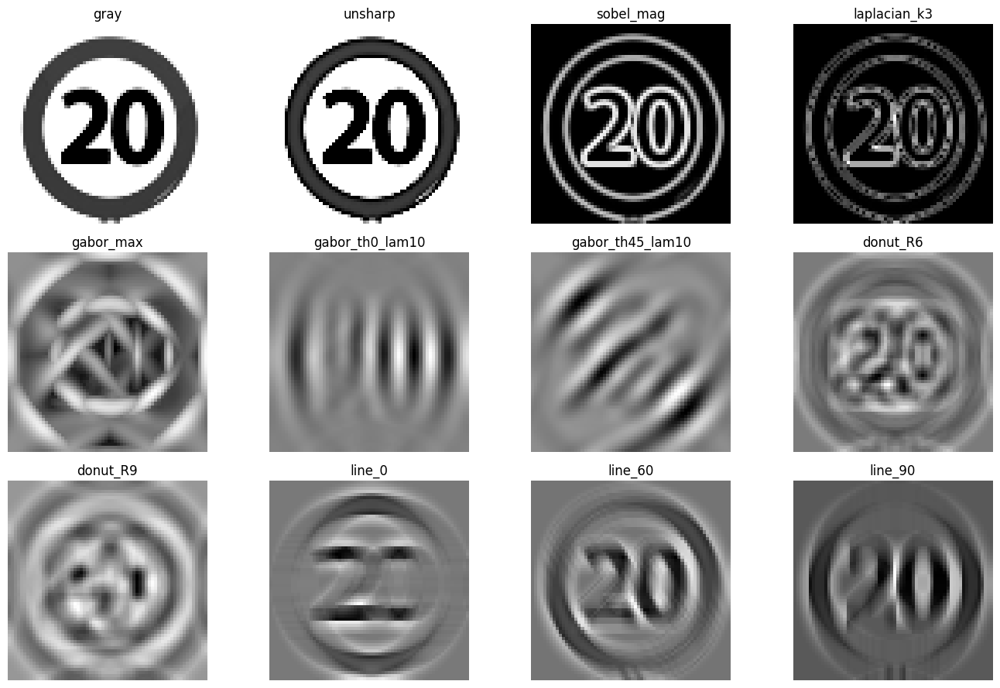

Metrics: {'baseline_energy': 218.4939, 'baseline_edge_ratio': 0.1428, 'unsharp_energy': 255.5795, 'unsharp_edge_ratio': 0.1458, 'lap_energy': 167.9706, 'lap_edge_ratio': 0.2385}

Class 0 — 00000_00006_00023.png


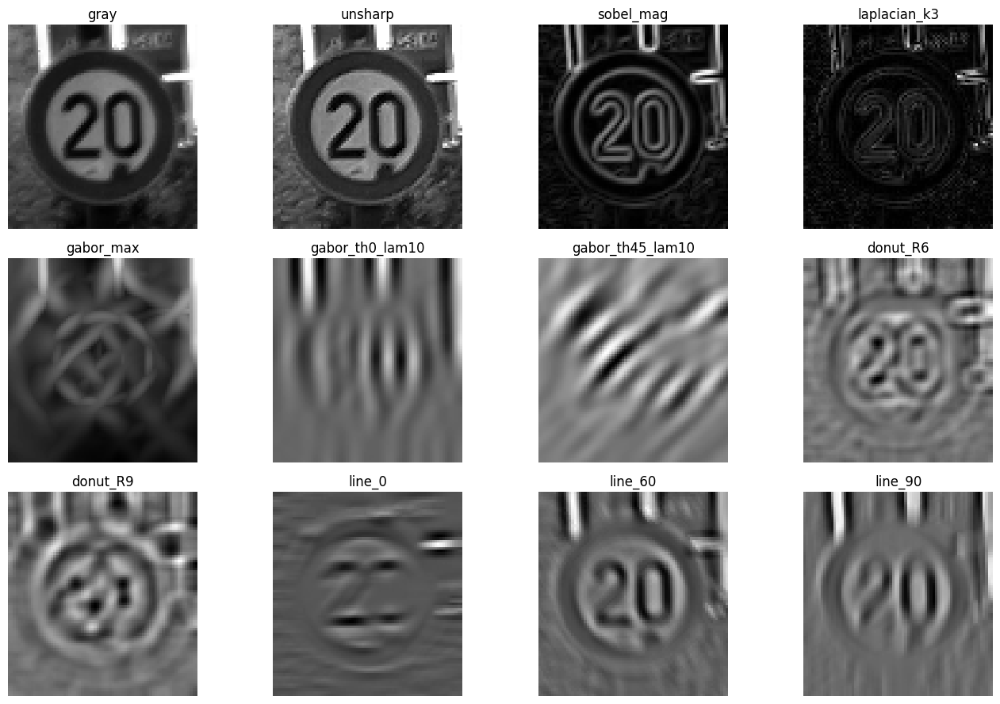

Metrics: {'baseline_energy': 101.6812, 'baseline_edge_ratio': 0.1618, 'unsharp_energy': 134.3838, 'unsharp_edge_ratio': 0.2354, 'lap_energy': 65.0181, 'lap_edge_ratio': 0.1429}

Class 1 — 00001_00027_00016.png


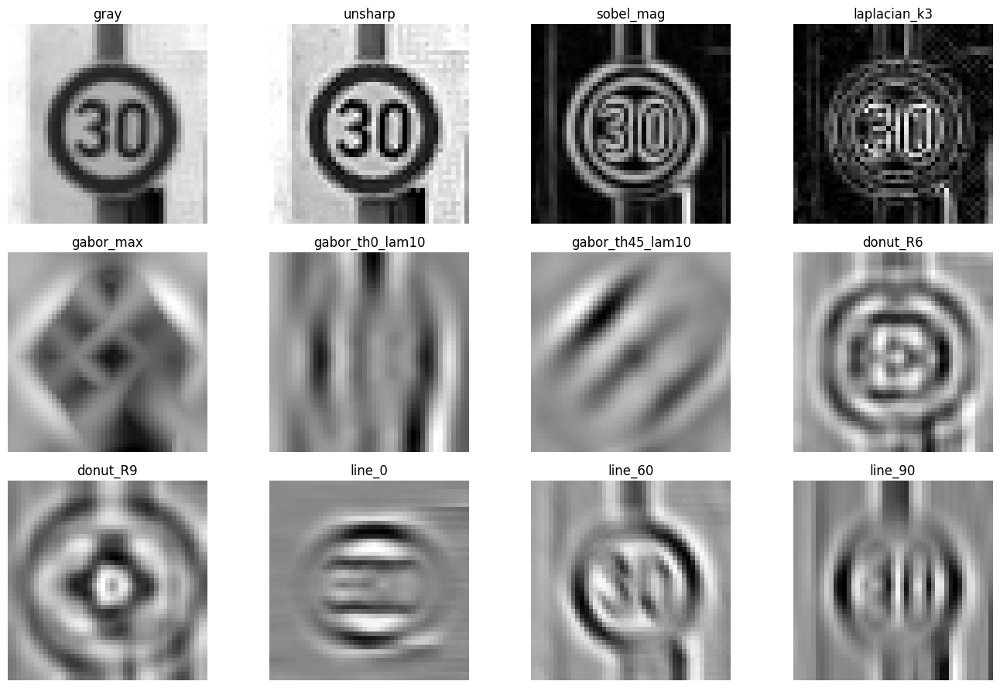

Metrics: {'baseline_energy': 150.2199, 'baseline_edge_ratio': 0.2025, 'unsharp_energy': 220.8175, 'unsharp_edge_ratio': 0.2173, 'lap_energy': 137.4173, 'lap_edge_ratio': 0.2919}

Class 1 — 00001_00057_00026.png


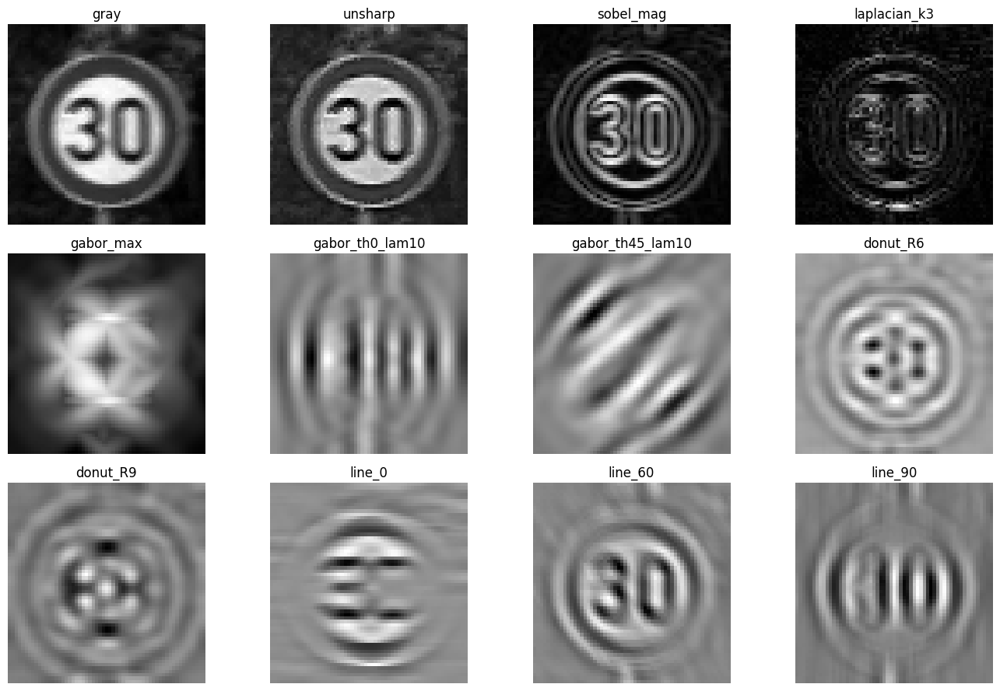

Metrics: {'baseline_energy': 66.6609, 'baseline_edge_ratio': 0.1636, 'unsharp_energy': 99.2999, 'unsharp_edge_ratio': 0.1924, 'lap_energy': 89.2329, 'lap_edge_ratio': 0.187}


In [23]:
def process_samples(muestras, out_root="out/bank", max_classes=2, max_per_class=2, visualize=True):
    classes = sorted(muestras.keys())[:max_classes]
    for cls in classes:
        for img_path in muestras[cls][:max_per_class]:
            bgr = cv.imread(img_path)
            if bgr is None: 
                print("⚠️ could not read:", img_path); 
                continue
            gray = to_gray_uint8(bgr)
            responses = run_filter_bank_on_gray(gray)

            # Save results
            out_dir = Path(out_root) / f"class_{cls}"
            save_bank_outputs(img_path, out_dir, responses)

            # Visualize a compact grid
            if visualize:
                print(f"\nClass {cls} — {Path(img_path).name}")
                show_filter_grid(bgr, responses, cols=4, max_items=12)

            # Metrics (print a tiny summary)
            m = compare_metrics(gray)
            print("Metrics:", {k: round(v, 4) for k, v in m.items()})

# Run it:
process_samples(muestra_imagenes, out_root="out/bank", max_classes=2, max_per_class=2, visualize=True)

### Agrupación de clases para aplicar filtros
#### Realizamos la agrupación de las clases para poder aplicar filtros a multiples clases relacionadas, y de este modo escoger cual elegir.

### Escogemos 3 imagenes random por cada classe.

In [12]:
import os

# Path to your dataset folder (after unzipping)
dataset_path = "./data"  # or the folder where Train/Test/Testing are located

dir_entrenamiento = os.path.join(dataset_path, "Train")

# Create a small representative sample
muestra_imagenes = seleccionar_imagenes_aleatorias(
    dir_entrenamiento,
    num_imagenes_por_clase=3,
    semilla=2212
)

print(f"Loaded {len(muestra_imagenes)} classes from the dataset.")


Loaded 63 classes from the dataset.


### Definimos los grupos y los filtros por grupo de classes  posteriormente definimos las classes para aplicar estos filtros y mostrar los resultados.

In [14]:
#-- Group definitions & filters per group --
# Which classIds belong to which group
GROUPS = {
    "speed_limits": [0,1,2,3,4,5,7,8],
    "end_speed_limits": [6,32],
    "no_passing": [9,10],
    "end_no_passing": [41,42],
    "priority_right_of_way": [11,12,13,14,43],
    "general_prohibitions": [15,16,17,49,50,51,52,53,54,55,56,57,58,61],
    "warnings_triangles": [18,19,20,21,22,23,24,25,26,27,28,29,30,31,44,45,46,47,48,60],
    "mandatory_directions": [33,34,35,36,37,38,39,40,62],
    "zones_rect_panels": [59],
}

# convenience: classId -> group name
CLASS_TO_GROUP = {cid: g for g, cids in GROUPS.items() for cid in cids}

# Which filters to use per group.
GROUP_FILTERS = {
    "speed_limits": ["unsharp","donut_R9","gabor_max","sobel_mag"],
    "end_speed_limits": ["unsharp","donut_R9","gabor_th45_lam10","laplacian_k3"],
    "no_passing": ["unsharp","sobel_mag","gabor_th0_lam10","gabor_th90_lam10","donut_R9"],
    "end_no_passing": ["unsharp","sobel_mag","gabor_th45_lam10","donut_R9"],
    "priority_right_of_way": ["unsharp","sobel_mag","line_0","line_90"],
    "general_prohibitions": ["unsharp","donut_R9","laplacian_k3","gabor_th45_lam10"],
    "warnings_triangles": ["unsharp","line_30","line_60","line_90","sobel_mag"],
    "mandatory_directions": ["unsharp","gabor_th0_lam10","gabor_th45_lam10","gabor_th90_lam10","gabor_th135_lam10","line_0","line_45","line_90","line_135","sobel_mag"],
    "zones_rect_panels": ["unsharp","line_0","line_90","sobel_mag"],
}

In [13]:
import math
from pathlib import Path
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


def _ensure_needed_channels(gray, wanted_keys):
    """
    Compute only what we need: a minimal 'bank' based on requested keys.
    It reuses your existing primitives: unsharp, sobel_mag, laplacian_edges,
    donut_kernel, line_kernel, apply_gabor_bank.
    """
    out = {}
    # Always keep a reference original gray
    out["gray"] = gray.astype(np.float32)

    # Decide what families are needed from names
    need_unsharp = any(k.startswith("unsharp") for k in wanted_keys)
    need_sobel   = any(k.startswith("sobel") for k in wanted_keys)
    need_lap     = any(k.startswith("laplacian") for k in wanted_keys)
    need_donut   = any(k.startswith("donut_") for k in wanted_keys)
    need_line    = any(k.startswith("line_") for k in wanted_keys)
    need_gabor   = any(k.startswith("gabor") for k in wanted_keys)

    if need_unsharp:
        out["unsharp"] = unsharp(gray, sigma=1.0, amount=1.5).astype(np.float32)

    if need_sobel:
        out["sobel_mag"] = sobel_mag(gray)

    if need_lap:
        out["laplacian_k3"] = laplacian_edges(gray, ksize=3)

    if need_donut:
        # parse radii present in keys: e.g., donut_R9
        radii = sorted({int(k.split("_R")[1]) for k in wanted_keys if k.startswith("donut_R")})
        for R in radii:
            dk = donut_kernel(radius=R, thickness=3)
            out[f"donut_R{R}"] = cv.filter2D(gray, cv.CV_32F, dk)

    if need_line:
        # parse line angles: line_0, line_45, ...
        angles = sorted({int(k.split("_")[1]) for k in wanted_keys if k.startswith("line_")})
        for ang in angles:
            lk = line_kernel(ang, length=9)
            out[f"line_{ang}"] = cv.filter2D(gray, cv.CV_32F, lk)

    if need_gabor:
        # Collect needed (theta, lambda) pairs and/or gabor_max
        need_max = any(k == "gabor_max" for k in wanted_keys)
        needed_pairs = []
        for k in wanted_keys:
            if k.startswith("gabor_th") and "_lam" in k:
                # gabor_th45_lam10
                deg = int(k.split("th")[1].split("_")[0])
                lam = float(k.split("lam")[1])
                needed_pairs.append((deg, lam))
        # Build once per theta/lambda; also build a superset for gabor_max if requested
        thetas_deg = sorted({deg for (deg, _) in needed_pairs}) if needed_pairs else [0,45,90,135]
        lambdas = sorted({lam for (_, lam) in needed_pairs}) if needed_pairs else [6,10,14]

        gabor_resps = {}
        for th_deg in thetas_deg:
            th = np.deg2rad(th_deg)
            for lam in lambdas:
                k = gabor_kernel(ksize=21, sigma=5, theta=th, lambd=lam, gamma=0.5, psi=0)
                resp = cv.filter2D(gray, cv.CV_32F, k)
                name = f"gabor_th{int(th_deg)}_lam{int(lam)}"
                gabor_resps[name] = resp
        out.update(gabor_resps)

        if need_max:
            if gabor_resps:
                stack = np.stack(list(gabor_resps.values()), axis=-1)
                out["gabor_max"] = np.max(stack, axis=-1)

    return out


def _show_grid(image_bgr, responses, keys_to_show, title, cols=4):
    items = [("original", cv.cvtColor(image_bgr, cv.COLOR_BGR2RGB))]
    # Prepare grayscale visualizations for response maps
    for k in keys_to_show:
        if k in responses:
            items.append((k, to_u8_0_255(responses[k])))
    rows = math.ceil(len(items)/cols)
    plt.figure(figsize=(3.6*cols, 3.2*rows))
    for i, (name, im) in enumerate(items, 1):
        plt.subplot(rows, cols, i)
        if name == "original":
            plt.imshow(im)  # RGB
        else:
            plt.imshow(im, cmap="gray")
        plt.title(name)
        plt.axis("off")
    plt.suptitle(title, y=1.02, fontsize=12)
    plt.tight_layout()
    plt.show()


def preview_by_groups(muestras, max_groups=None, max_classes_per_group=2, max_imgs_per_class=2,
                      save_png=False, out_root="out/group_previews"):
    """
    For each group:
      - pick up to max_classes_per_group classes,
      - for each class pick up to max_imgs_per_class images,
      - compute only the group's selected filters,
      - show a grid per image (original + responses).
      - optionally save PNGs.
    """
    groups = list(GROUPS.keys())
    if max_groups is not None:
        groups = groups[:max_groups]

    for g in groups:
        wanted = GROUP_FILTERS[g]
        # gather classes for this group that exist in muestras
        cids = [cid for cid in GROUPS[g] if cid in muestras]
        if not cids:
            print(f"[{g}] No sampled images for this group.")
            continue
        cids = cids[:max_classes_per_group]

        for cid in cids:
            img_paths = muestras[cid][:max_imgs_per_class]
            for img_path in img_paths:
                bgr = cv.imread(img_path)
                if bgr is None:
                    print("⚠️ could not read:", img_path); 
                    continue
                gray = cv.cvtColor(bgr, cv.COLOR_BGR2GRAY)

                # compute only what we need
                resp = _ensure_needed_channels(gray, wanted)

                # visualize
                short_title = f"Group: {g} | Class {cid} | {Path(img_path).name}"
                _show_grid(bgr, resp, ["unsharp","sobel_mag","laplacian_k3","gabor_max"] +
                                  [k for k in wanted if k not in {"unsharp","sobel_mag","laplacian_k3","gabor_max"}],
                           title=short_title, cols=4)

                # optional saving
                if save_png:
                    out_dir = Path(out_root) / f"{g}" / f"class_{cid}" / Path(img_path).stem
                    out_dir.mkdir(parents=True, exist_ok=True)
                    # save only requested maps (normalized) + original
                    cv.imwrite(str(out_dir / "original.png"), cv.cvtColor(bgr, cv.COLOR_BGR2RGB))
                    for k in wanted:
                        if k in resp:
                            cv.imwrite(str(out_dir / f"{k}.png"), to_u8_0_255(resp[k]))


### Ejecutamos la funcion para mostrar en un grid los resultados de los filtros sobre los grupos.

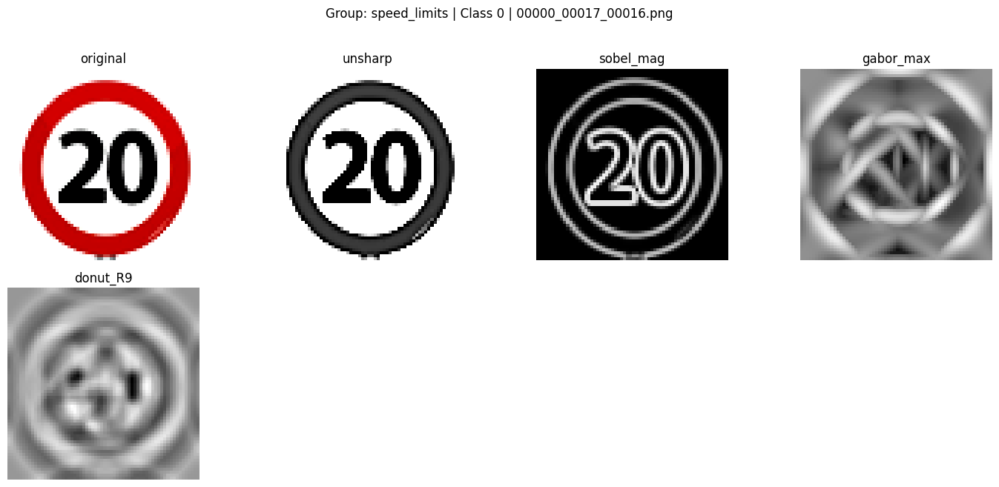

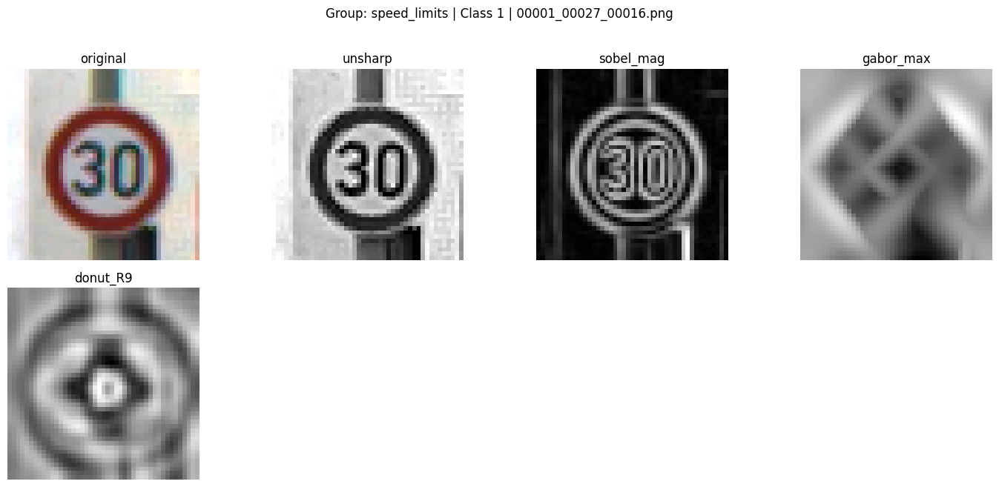

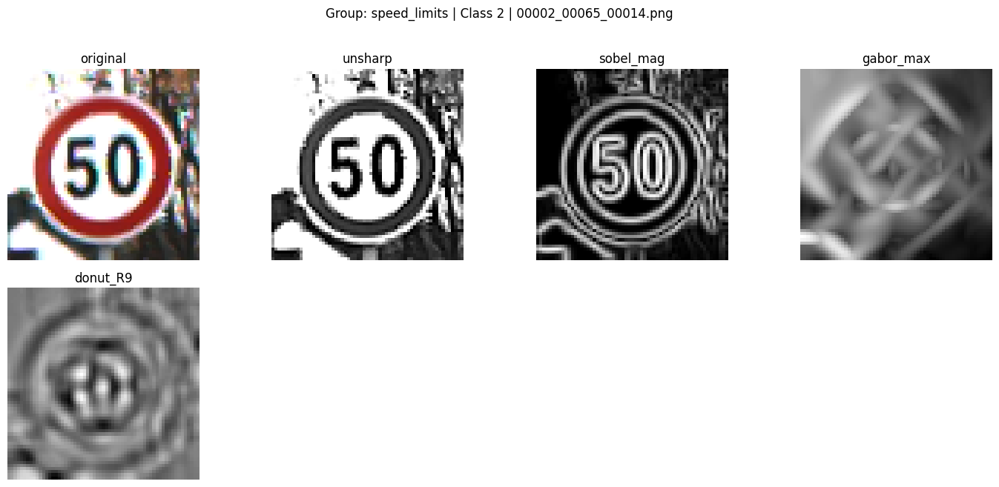

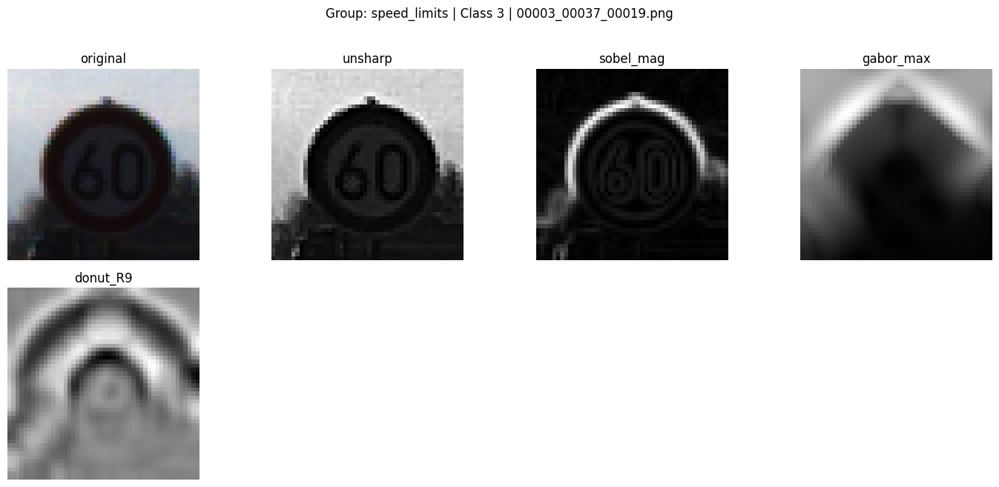

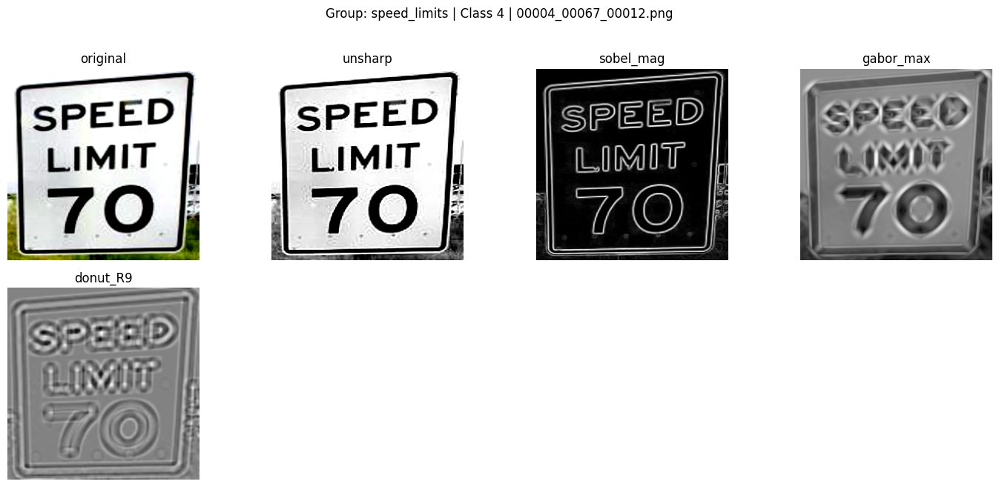

...

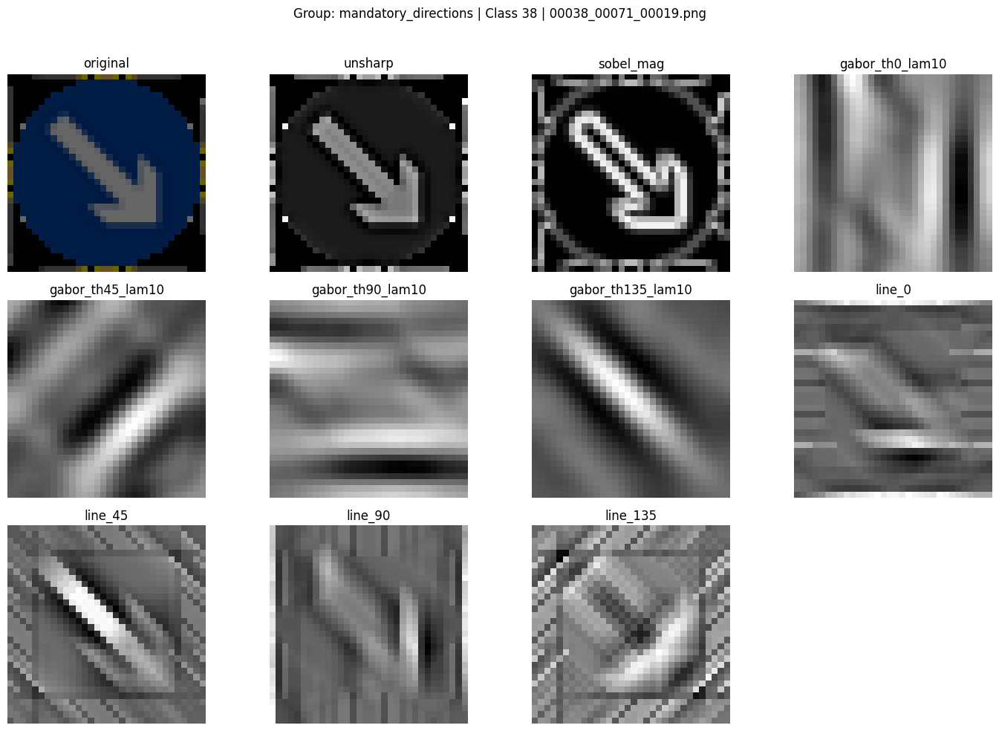

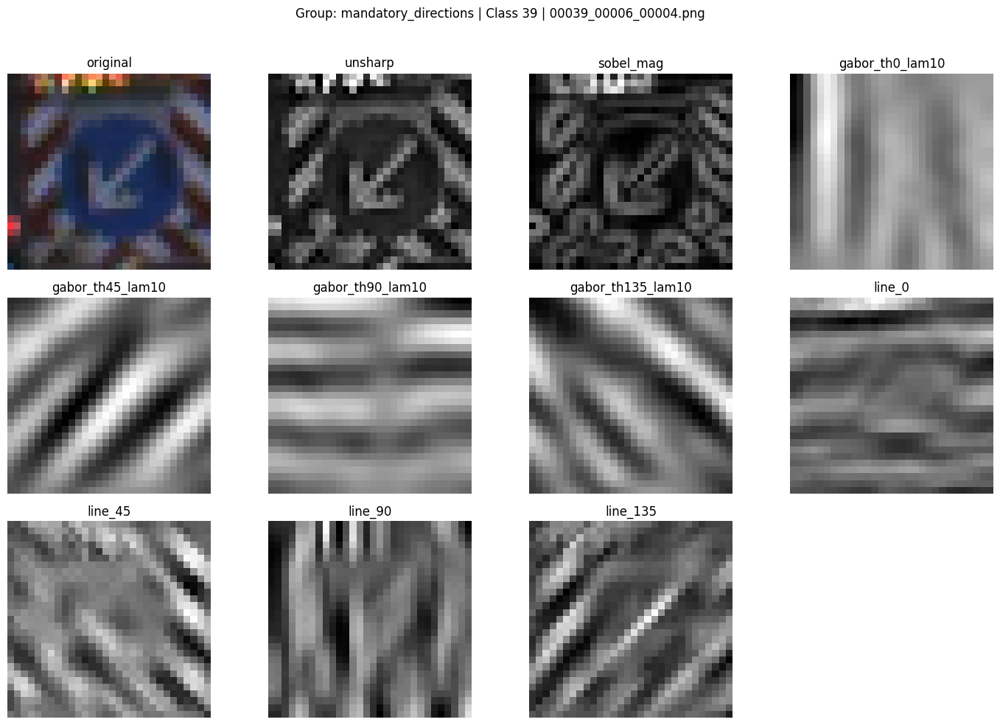

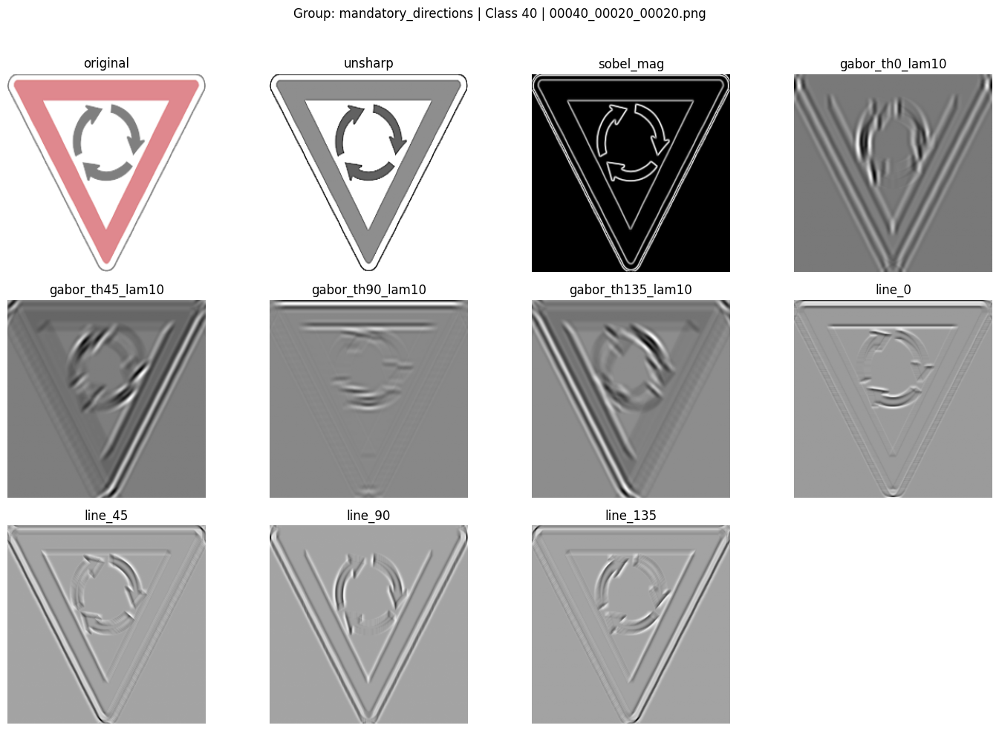

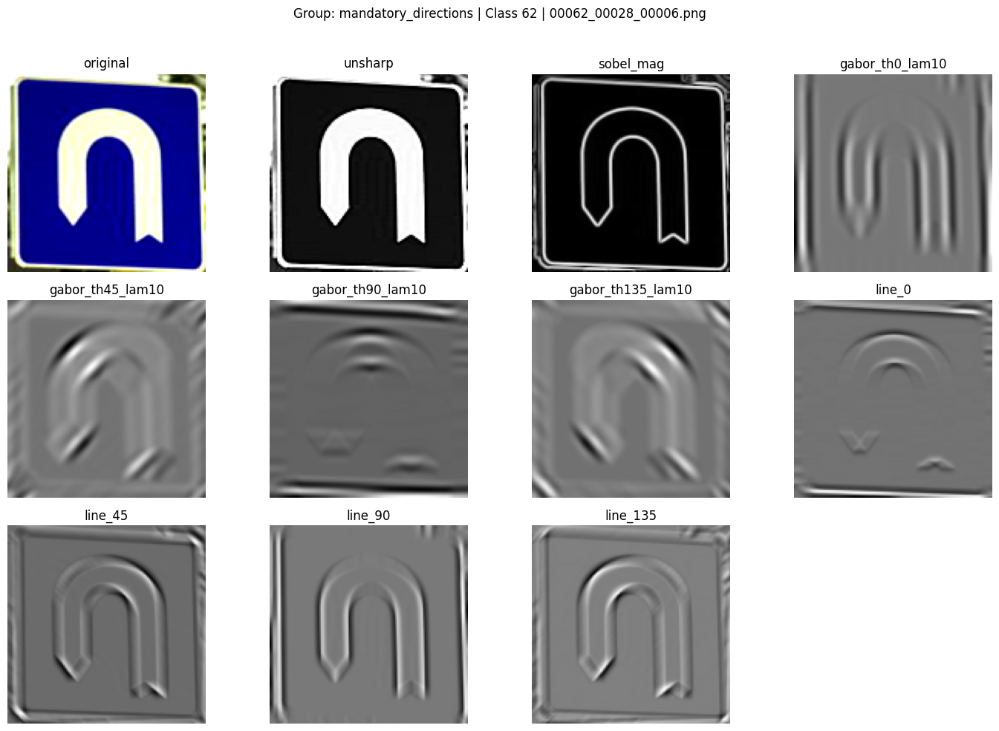

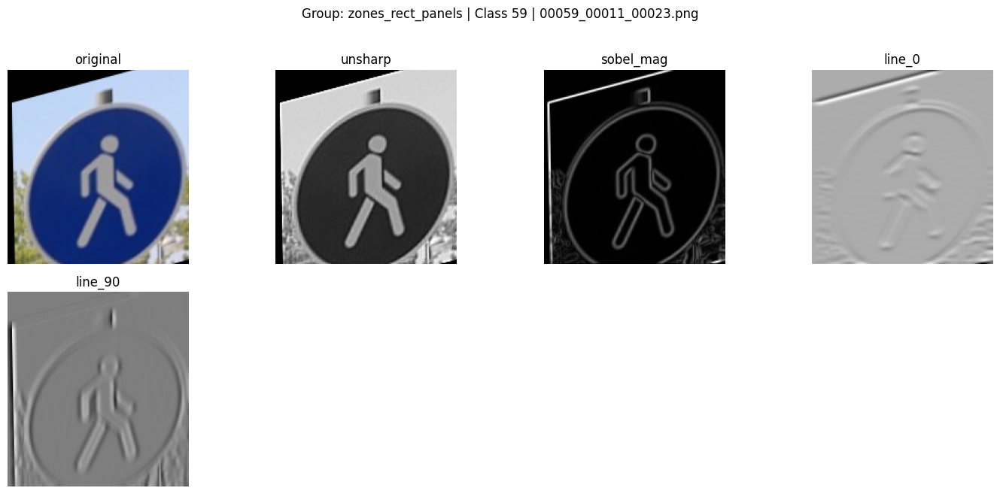

In [24]:
# ---- RUN IT ----
# Example: preview all groups, but limit to 2 classes per group and 2 images per class
preview_by_groups(
    muestra_imagenes,          # your dict: {class_id(int or str): [image_paths]}
    max_groups=None,           # or an int to limit how many groups to preview
    max_classes_per_group=20,   # tweak as you like
    max_imgs_per_class=1,      # tweak as you like
    save_png=False             # set True to save the grids as PNGs per image
)